Histogram Charts:


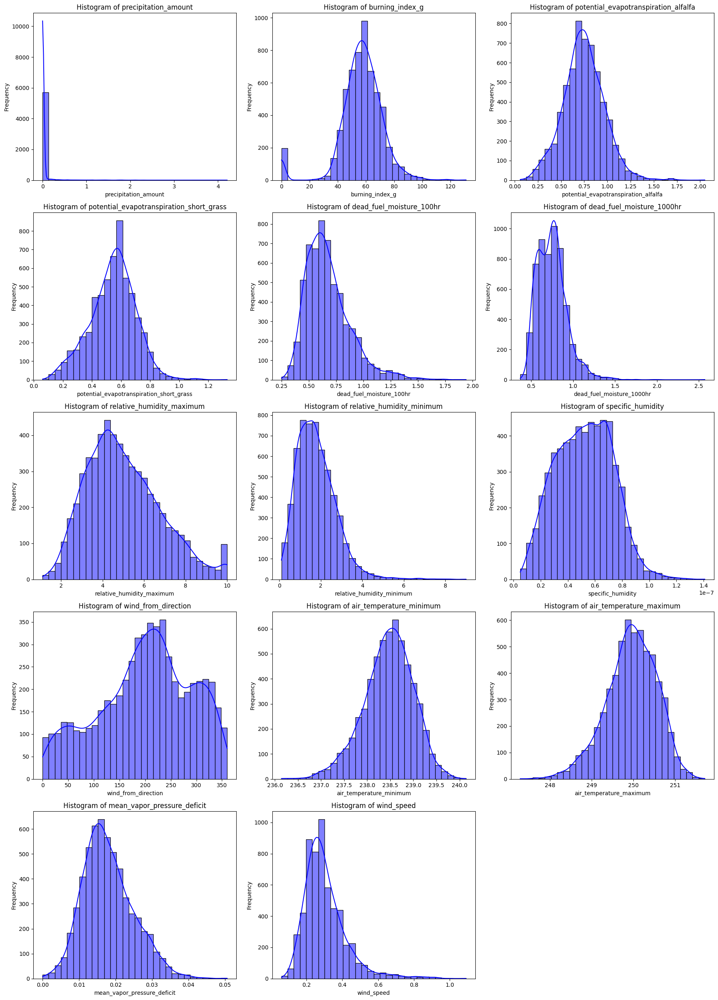

Boxplot Charts


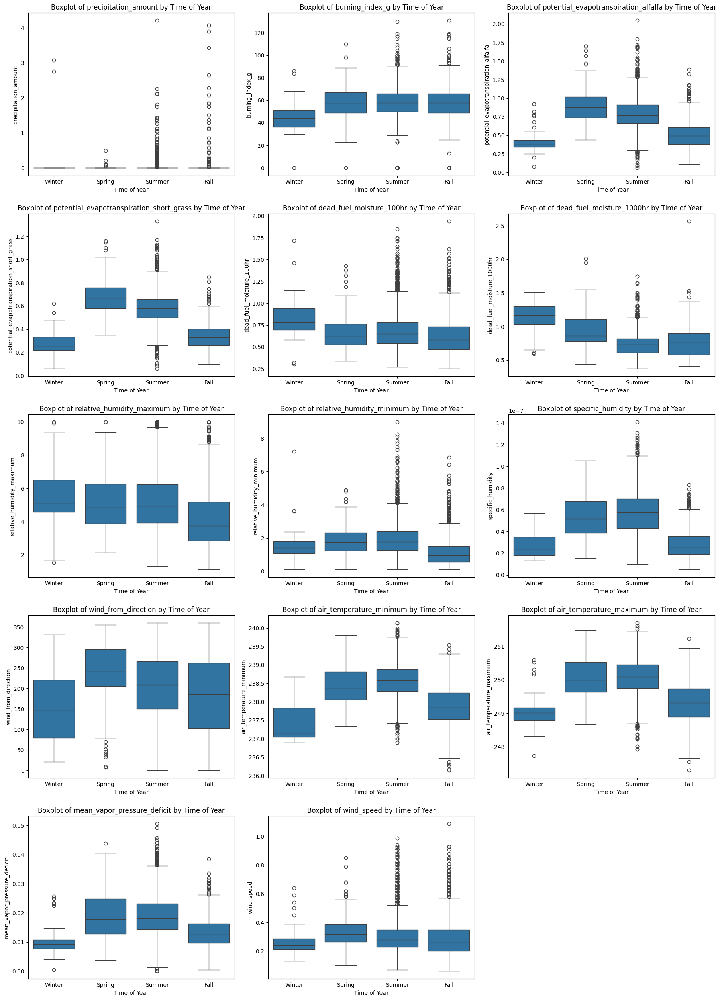

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv("all_polygons_with_climate_variables.csv")

# Ensure DOY (Day of Year) column exists or calculate it from date
if "DOY" not in data.columns:
    data["DOY"] = pd.to_datetime(data["YYYYMMDD"]).dt.dayofyear

# Add 'time_of_year' as a categorical variable (e.g., seasons or weeks)
data["time_of_year"] = pd.cut(
    data["DOY"],
    bins=[0, 91, 183, 275, 366],
    labels=["Winter", "Spring", "Summer", "Fall"],
    right=False
)

# List of relevant variables
climate_variables = [
    "precipitation_amount",
    "burning_index_g",
    "potential_evapotranspiration_alfalfa",
    "potential_evapotranspiration_short_grass",
    "dead_fuel_moisture_100hr",
    "dead_fuel_moisture_1000hr",
    "relative_humidity_maximum",
    "relative_humidity_minimum",
    "specific_humidity",
    "wind_from_direction",
    "air_temperature_minimum",
    "air_temperature_maximum",
    "mean_vapor_pressure_deficit",
    "wind_speed",
    "time_of_year",
]

# Function to plot histograms
def plot_histograms(data, variables):
    num_vars = len(variables)
    cols = 3
    rows = (num_vars // cols) + (1 if num_vars % cols != 0 else 0)
    
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
    axes = axes.flatten()

    for i, var in enumerate(variables):
        if var in data.columns and pd.api.types.is_numeric_dtype(data[var]):
            sns.histplot(data[var], bins=30, kde=True, ax=axes[i], color="blue")
            axes[i].set_title(f"Histogram of {var}")
            axes[i].set_xlabel(var)
            axes[i].set_ylabel("Frequency")
        else:
            axes[i].axis("off")  # Turn off unused axes

    # Turn off remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# Function to plot boxplots
def plot_boxplots(data, variables):
    num_vars = len(variables)
    cols = 3
    rows = (num_vars // cols) + (1 if num_vars % cols != 0 else 0)
    
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
    axes = axes.flatten()

    for i, var in enumerate(variables):
        if var in data.columns and pd.api.types.is_numeric_dtype(data[var]):
            sns.boxplot(x=data["time_of_year"], y=data[var], ax=axes[i])
            axes[i].set_title(f"Boxplot of {var} by Time of Year")
            axes[i].set_xlabel("Time of Year")
            axes[i].set_ylabel(var)
        else:
            axes[i].axis("off")  # Turn off unused axes

    # Turn off remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# Perform Univariate Analysis
print("Histogram Charts:")
plot_histograms(data, climate_variables)

print("Boxplot Charts")
plot_boxplots(data, climate_variables)

Most of the data was mostly symmetrically distributed with slight skewing to the right. The right skew is expected in several of these variables like humidity, evapotranspiration, and wind speed as paritcularly high values of these are not as likely due to the desert climate of California. However, there are some variables that are left skewed like temperature, which is also expected given the desert climate of California. California typically has hot dry weather. Most outliers seem within reason, however some definitely require more exploration past this univariate analysis to see if they should be kept or removed from the data. For example, precipitation seems to be mostly centered around 0, however there are several points that are significantly different. From the distribution of the days of the year, we can see that there were fires from winter and spring, which may explain the higher precipitation days (rainier seasons). Other climate variables are likely to be explained by the time of the year as well. 

Performing Correlation Matrix and Pair Plot...

Correlation Matrix:
                                          precipitation_amount  \
precipitation_amount                                  1.000000   
burning_index_g                                      -0.404503   
potential_evapotranspiration_alfalfa                 -0.172008   
potential_evapotranspiration_short_grass             -0.176746   
dead_fuel_moisture_100hr                              0.275813   
dead_fuel_moisture_1000hr                             0.094818   
relative_humidity_maximum                             0.203139   
relative_humidity_minimum                             0.287428   
specific_humidity                                     0.057164   
wind_from_direction                                  -0.005850   
air_temperature_minimum                              -0.121247   
air_temperature_maximum                              -0.172131   
mean_vapor_pressure_deficit                          -0.177388   
wind_spe

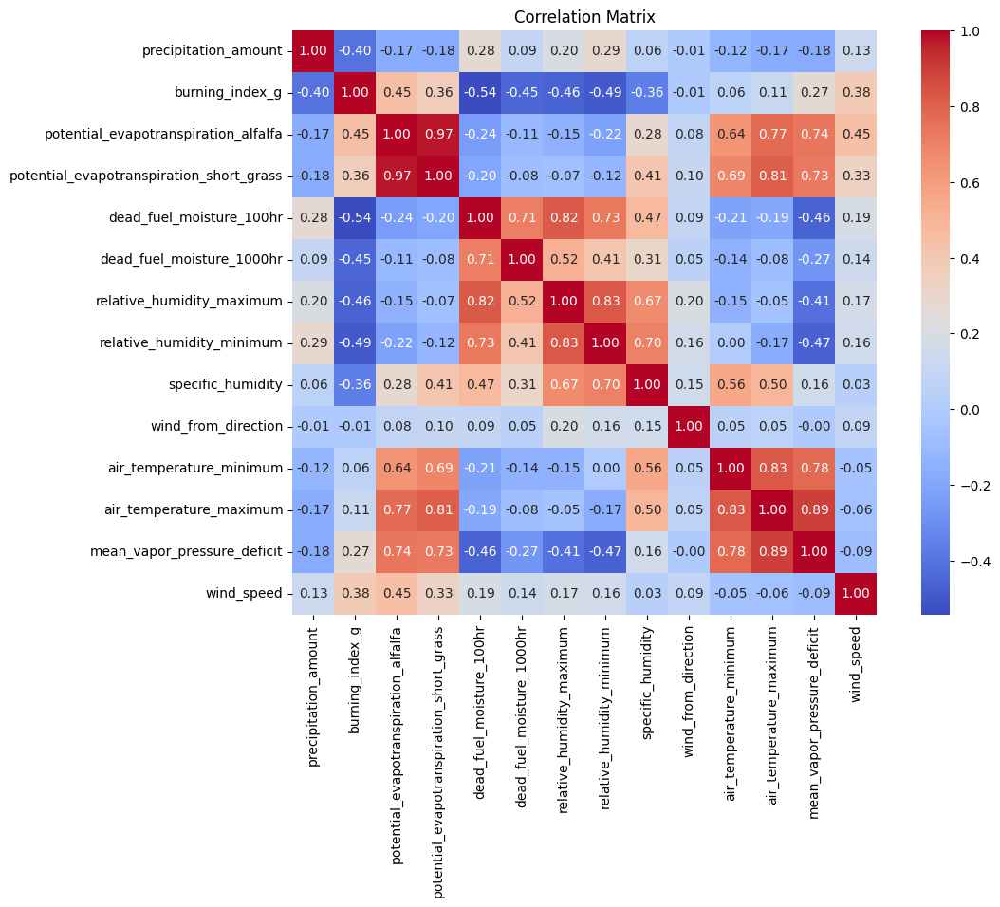

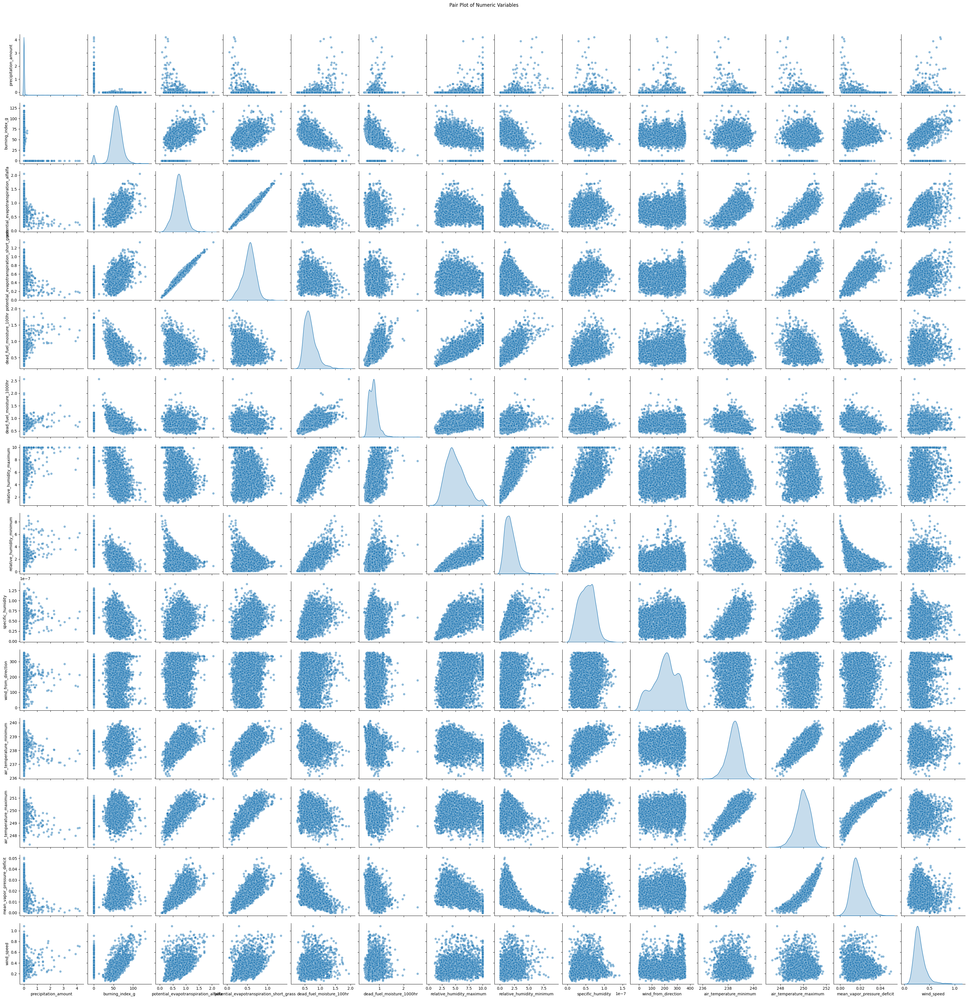

Generating Boxplots for Climate Variables by Time of Year...


/var/folders/tg/g_9jh2s10rd4bkgfm4zw5pqc0000gn/T/ipykernel_19925/727628541.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=category, y=var, data=data, palette="viridis", ax=axes[i])
/var/folders/tg/g_9jh2s10rd4bkgfm4zw5pqc0000gn/T/ipykernel_19925/727628541.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=category, y=var, data=data, palette="viridis", ax=axes[i])
/var/folders/tg/g_9jh2s10rd4bkgfm4zw5pqc0000gn/T/ipykernel_19925/727628541.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=category, y=var, data=data, palette="vi

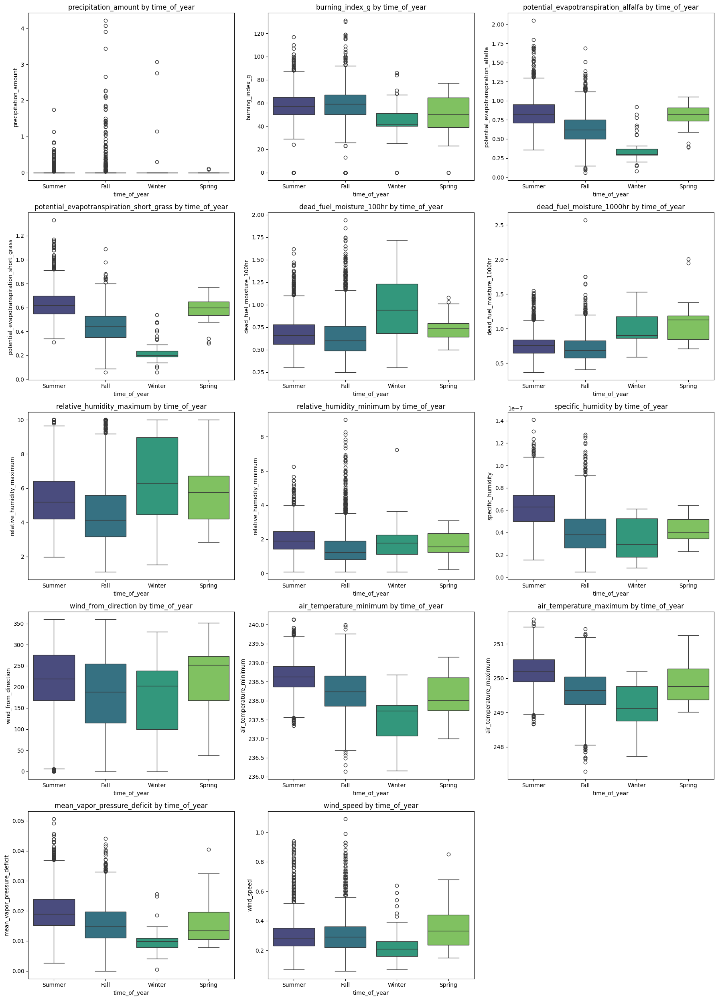

In [7]:
# Ensure the `time_of_year` column is treated as categorical
data["time_of_year"] = data["time_of_year"].astype(str)

# Correlation Matrix and Pair Plot
def correlation_and_pairplot(data, variables):
    # Filter only numeric variables
    numeric_vars = [var for var in variables if pd.api.types.is_numeric_dtype(data[var])]
    
    # Compute correlation matrix
    correlation_matrix = data[numeric_vars].corr()
    print("\nCorrelation Matrix:")
    print(correlation_matrix)

    # Plot correlation matrix as a heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
    plt.title("Correlation Matrix")
    plt.show()

    # Pair plot for numeric variables
    sns.pairplot(data[numeric_vars], diag_kind="kde", plot_kws={"alpha": 0.5})
    plt.suptitle("Pair Plot of Numeric Variables", y=1.02)
    plt.show()

# Boxplots for each variable against `time_of_year`
def boxplots_against_time_of_year(data, variables, category):
    # Exclude the category itself from the variables
    variables = [var for var in variables if var != category]
    
    num_vars = len(variables)
    cols = 3
    rows = (num_vars // cols) + (1 if num_vars % cols != 0 else 0)
    
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
    axes = axes.flatten()

    for i, var in enumerate(variables):
        if var in data.columns and pd.api.types.is_numeric_dtype(data[var]):
            sns.boxplot(x=category, y=var, data=data, palette="viridis", ax=axes[i])
            axes[i].set_title(f"{var} by {category}")
            axes[i].set_xlabel(category)
            axes[i].set_ylabel(var)
        else:
            axes[i].axis("off")  # Turn off unused axes

    # Turn off remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# Perform the analysis
print("Performing Correlation Matrix and Pair Plot...")
correlation_and_pairplot(data, climate_variables)

print("Generating Boxplots for Climate Variables by Time of Year...")
boxplots_against_time_of_year(data, climate_variables, "time_of_year")